In [18]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("iamsouravbanerjee/animal-image-dataset-90-different-animals")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/animal-image-dataset-90-different-animals


In [13]:
# importing necessary libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report


In [14]:
# Ensuring the Gpu is being used
physical_devices = tf.config.experimental.list_physical_devices('GPU')
if len(physical_devices) > 0:
  tf.config.experimental.set_memory_growth(physical_devices[0], True)
  print('GPU is being used')
else:
  print('GPU is not being used')

GPU is being used


In [19]:
# path to dataset
dataset_path = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals"

# List all the classes (Animal Types)
classes = os.listdir(dataset_path)
num_Classes = len(classes)

# Display the number of classes along with names
print(f'Number of Classes: {num_Classes}')
print(f'Classes: {classes}')



Number of Classes: 90
Classes: ['beetle', 'parrot', 'fox', 'wolf', 'hedgehog', 'turtle', 'snake', 'shark', 'horse', 'antelope', 'hamster', 'woodpecker', 'eagle', 'chimpanzee', 'bison', 'penguin', 'butterfly', 'sandpiper', 'hornbill', 'lion', 'lobster', 'oyster', 'otter', 'grasshopper', 'raccoon', 'dog', 'pigeon', 'donkey', 'hippopotamus', 'hummingbird', 'bear', 'coyote', 'bee', 'pig', 'rat', 'owl', 'caterpillar', 'koala', 'squid', 'hare', 'whale', 'mouse', 'tiger', 'fly', 'lizard', 'orangutan', 'bat', 'porcupine', 'kangaroo', 'gorilla', 'starfish', 'mosquito', 'crow', 'possum', 'goldfish', 'swan', 'elephant', 'sheep', 'dragonfly', 'zebra', 'seal', 'octopus', 'cow', 'ox', 'wombat', 'reindeer', 'panda', 'duck', 'goose', 'goat', 'badger', 'flamingo', 'crab', 'seahorse', 'rhinoceros', 'dolphin', 'okapi', 'moth', 'sparrow', 'pelecaniformes', 'squirrel', 'leopard', 'jellyfish', 'ladybugs', 'cockroach', 'hyena', 'cat', 'deer', 'turkey', 'boar']


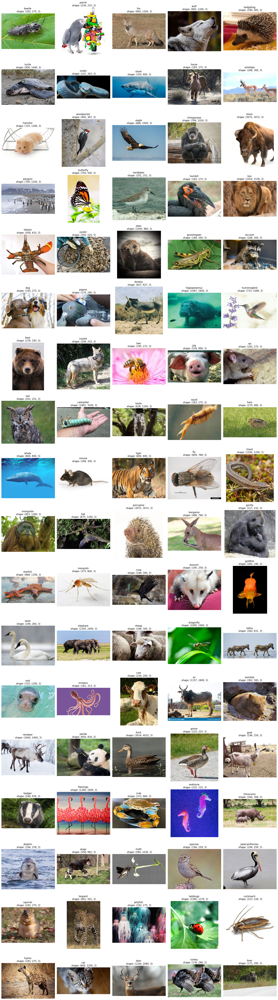

In [20]:
num_cols = 5  # You can adjust this for the number of columns you prefer
num_rows = (num_Classes + num_cols - 1) // num_cols

# Visualize sample images from the dataset
plt.figure(figsize=(20, num_rows * 4))  # Adjust figsize for better scaling

for i, class_name in enumerate(classes):
    class_path = os.path.join(dataset_path, class_name)
    if os.listdir(class_path):
        img_name = os.listdir(class_path)[0]
        img_path = os.path.join(class_path, img_name)
        try:
            img = plt.imread(img_path)
            plt.subplot(num_rows, num_cols, i + 1)
            plt.imshow(img)
            plt.title(f'{class_name} \n shape: {img.shape}')
            plt.axis('off')
        except FileNotFoundError:
            print(f"Warning: Image file not found for class {class_name}")
    else:
        print(f"Warning: No images found in class directory {class_name}")

plt.tight_layout()
plt.show()